## Mount Google Drive and Install YOLOv8

In [14]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [19]:
# Access YOLOv8 root folder
import os
os.chdir("/content/gdrive/MyDrive/yolov8")

In [20]:
# Install YOLOv8
%pip install ultralytics

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.231 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 27.8/78.2 GB disk)


## Dataset

In [ ]:
# Check Dataset
!ls data/

data.yaml  DRDO.zip  runs  Trash_data  Trash_data.zip  V_data.zip  yolov8n.pt


In [ ]:
# Unzip Dataset
!unzip data/DRDO.zip -d ./data

Streaming output truncated to the last 5000 lines.
  inflating: ./data/DRDO_data/labels/train/4004.txt  
  inflating: ./data/DRDO_data/labels/train/4005.txt  
  inflating: ./data/DRDO_data/labels/train/4006.txt  
  inflating: ./data/DRDO_data/labels/train/4009.txt  
  inflating: ./data/DRDO_data/labels/train/401.txt  
  inflating: ./data/DRDO_data/labels/train/4010.txt  
  inflating: ./data/DRDO_data/labels/train/4011.txt  
  inflating: ./data/DRDO_data/labels/train/4012.txt  
  inflating: ./data/DRDO_data/labels/train/4013.txt  
  inflating: ./data/DRDO_data/labels/train/4014.txt  
  inflating: ./data/DRDO_data/labels/train/4015.txt  
  inflating: ./data/DRDO_data/labels/train/4016.txt  
  inflating: ./data/DRDO_data/labels/train/4017.txt  
  inflating: ./data/DRDO_data/labels/train/4018.txt  
  inflating: ./data/DRDO_data/labels/train/4019.txt  
  inflating: ./data/DRDO_data/labels/train/402.txt  
  inflating: ./data/DRDO_data/labels/train/4020.txt  
  inflating: ./data/DRDO_data/lab

In [ ]:
# Check data folder
%cd data

!ls

/content/gdrive/MyDrive/yolov8/data
data.yaml  DRDO_data  DRDO.zip	runs  Trash_data  Trash_data.zip  V_data.zip  yolov8n.pt


## Data File

In [ ]:
# Download sample data file
!gdown https://drive.google.com/uc?id=1joW_me3Gtzxm4d48edbMsOpooV8snDdn

In [ ]:
# Rename sample data file
import os
os.rename("data.yaml", "face_mask.yaml")

!ls

In [ ]:
# Get Absolute Path
import os

print(os.getcwd())

/content/gdrive/MyDrive/yolov8/data


In [ ]:
# Back to root folder
%cd ../

/content/gdrive/MyDrive/yolov8


## Training Process

In [ ]:
# Train
!yolo detect train model=yolov8l.pt data=/content/gdrive/MyDrive/yolov8/data/data.yaml imgsz=640 workers=8 batch=8 device=0 epochs=300 patience=50 name=Weapon_Modelling

Ultralytics YOLOv8.0.231 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8l.pt, data=/content/gdrive/MyDrive/yolov8/data/data.yaml, epochs=300, time=None, patience=50, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=Weapon_Modelling, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=Tru

## Continue Training

In [23]:
# Continue Train
!yolo detect train model=/content/gdrive/MyDrive/yolov8/runs/detect/Weapon_Modelling/weights/last.pt data=/content/gdrive/MyDrive/yolov8/data/data.yaml resume=True

Ultralytics YOLOv8.0.231 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=/content/gdrive/MyDrive/yolov8/runs/detect/Weapon_Modelling/weights/last.pt, data=/content/gdrive/MyDrive/yolov8/data/data.yaml, epochs=300, time=None, patience=50, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=Weapon_Modelling, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, 

In [24]:
# See the accuracy
%load_ext tensorboard

%tensorboard --logdir /content/gdrive/MyDrive/yolov8/runs/detect/Weapon_Modelling

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

## Detection

In [25]:
# Go to inference folder and create a new folder
%cd inference

# !mkdir HSV

/content/gdrive/MyDrive/yolov8/inference


In [ ]:
# Back to root folder
%cd ../../

/content/gdrive/MyDrive


In [38]:
# Detection
!yolo detect predict model=/content/gdrive/MyDrive/yolov8/runs/detect/Weapon_Modelling/weights/best.pt source="/content/gdrive/MyDrive/yolov8/inference/gun/8.jpg" save=True

Ultralytics YOLOv8.0.231 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 268 layers, 43608150 parameters, 0 gradients, 164.8 GFLOPs

WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/1 /content/gdrive/MyDrive/yolov8/inference/gun/8.jpg: 448x640 1 Weapon, 124.2ms
Speed: 4.4ms preprocess, 124.2ms inference, 840.5ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict6
💡 Learn more at https://docs.ultralytics.com/modes/predict


In [27]:
# Function to show Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def showImage(path):
  img = mpimg.imread(path)
  plt.figure(figsize=(20,20))
  plt.axis("off")
  plt.imshow(img)
  plt.show()

def showImagesOnFolder(path):
  for file in os.listdir(path):
    if (file.endswith(".png") or file.endswith(".jpg")):
      image_path = os.path.join(path, file)
      showImage(image_path)

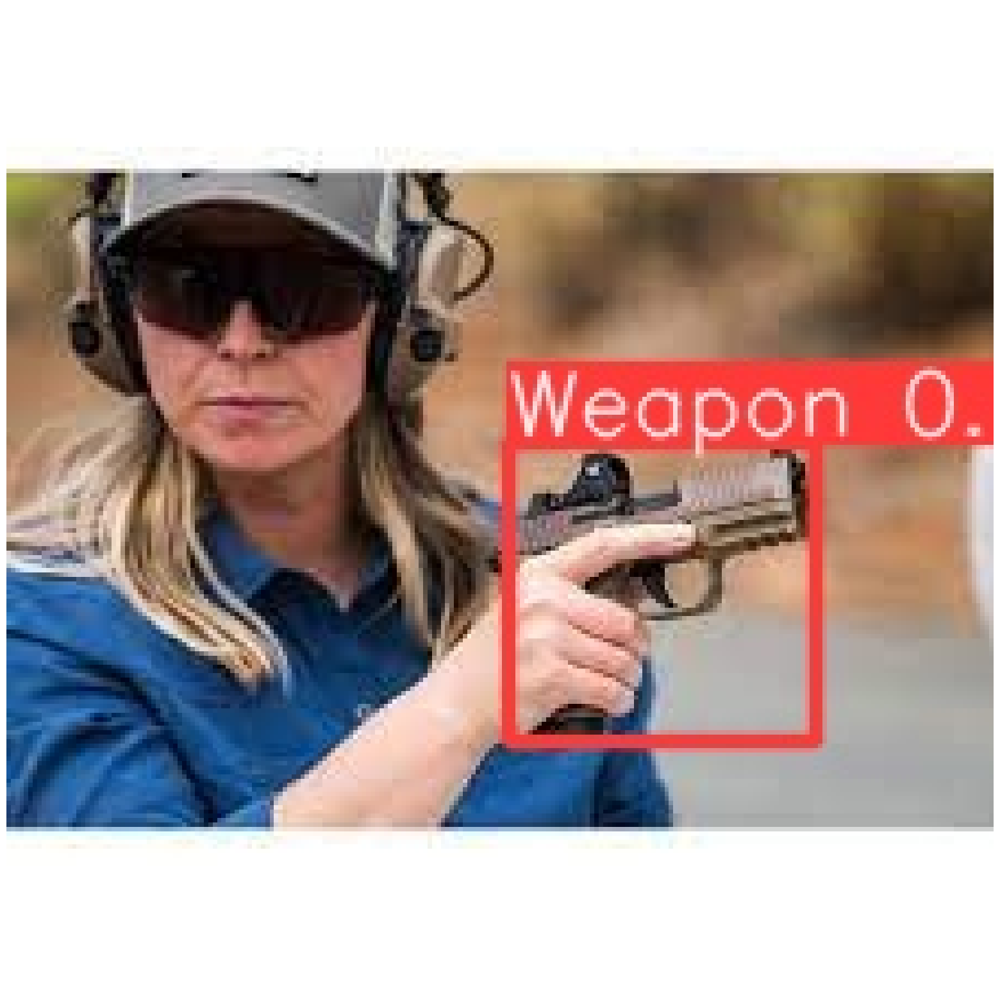

In [32]:
# Show All Detection Result
showImagesOnFolder("runs/detect/predict3")

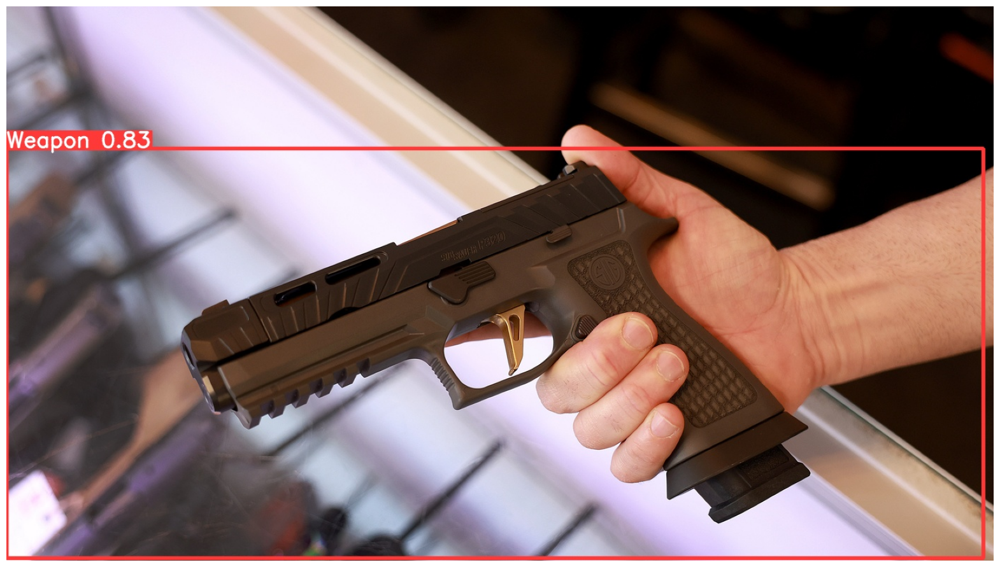

In [34]:
showImagesOnFolder("runs/detect/predict4")

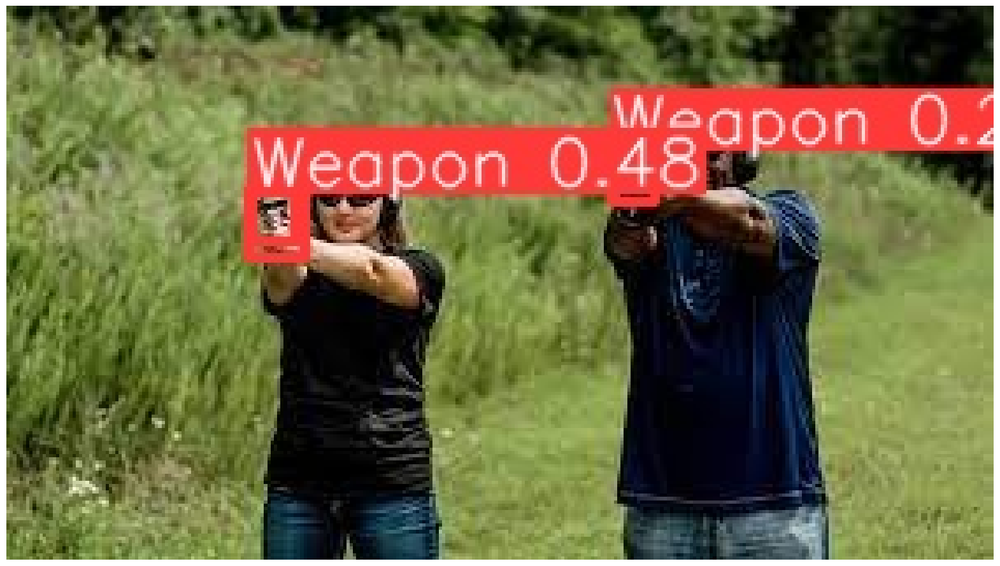

In [37]:
showImagesOnFolder("runs/detect/predict5")

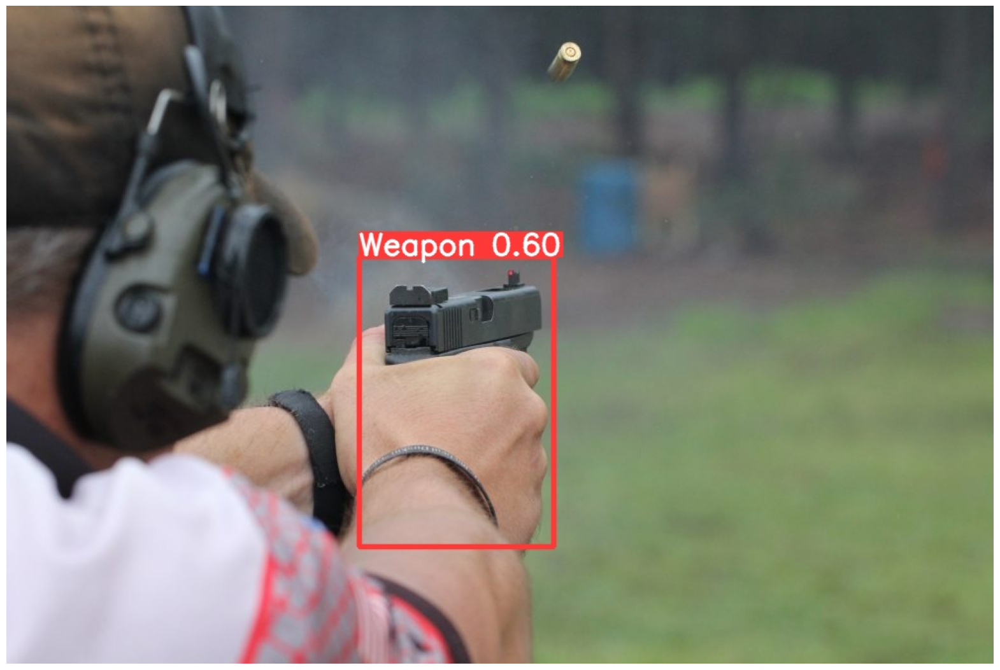

In [39]:
showImagesOnFolder("runs/detect/predict6")